This notebook is an implementation of a deep learning pipeline for **biomedical image segmentation** that focuses on **Explainable AI (XAI)**. The model uses **Grad-CAM++** to generate visual explanations, or heatmaps, that highlight the regions of the image most important for the model's predictions (MONAI+DensenEt121). The goal is to make the model's decision-making process more transparent and understandable.

The core of the architecture is a **UNet++** model with an **EfficientNet-B3** backbone. This model is trained to segment mycetoma species, and the Grad-CAM++ technique is then applied to the output of the final layer to visualize the activation maps, which indicate the pixel-level importance for classification.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install -q torch_snippets pytorch_model_summary
!pip install torchsummary

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.6/106.6 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.7/84.7 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.7/218.7 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.7/162.7 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 kB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 79.4 MB/s eta 0:00:00


In [ ]:
from torch_snippets import *
import os
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from sklearn.model_selection import train_test_split
device = 'cuda' if torch.cuda.is_available() else 'cpu'
from torch.utils.data import Dataset, DataLoader
from torchvision.models.segmentation import deeplabv3_resnet101
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchsummary import summary

# Define transformations
tfms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

ROOT_DIR = '/content/drive/MyDrive/segmentation-dataset-jpg-image-mask/'

CATEGORIES = ['falciformisporasenegalensis',
              'actionmadureapelletrii',
              'madurellamycetomatis',
              'streptomycessomaliesnis']

# Define the SegData class for custom dataset
class SegData(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, gradcam_path, mask_path, category = self.data[idx]

        # Open and resize original image
        image = Image.open(img_path).convert("RGB")
        image = image.resize((224, 224))

        # Load the corresponding Grad-CAM image
        gradcam = Image.open(gradcam_path).convert("RGB")
        gradcam = gradcam.resize((224, 224))

        # Open and resize mask
        mask = Image.open(mask_path).convert("L")
        mask = mask.resize((224, 224))

        # Apply transformations
        if self.transform:
            image = self.transform(image)
            gradcam = self.transform(gradcam)

        # Concatenate original image with Grad-CAM overlay (along channels)
        input_image = torch.cat((image, gradcam), dim=0)  # Concatenate along channel dimension

        # Convert mask to tensor and scale
        mask = torch.tensor(np.array(mask) / 255, dtype=torch.float32)

        return image, mask, gradcam, input_image

    def collate_fn(self, batch):
        ims, masks, gradcams, input_images = zip(*batch)
        ims = torch.stack(ims).to(device)
        gradcams = torch.stack(gradcams).to(device)
        ce_masks = torch.stack(masks).long().to(device)
        input_images= torch.stack(input_images).to(device)
        return ims, ce_masks, gradcams, input_images

In [ ]:
# Load and split data
def load_data(root_dir, categories):
    data = []
    for category in tqdm(categories):
        img_paths = os.path.join(root_dir, 'images', category)
        gradcam_paths = os.path.join(root_dir, 'images_gradcamPlusPlus', category)  # Grad-CAM overlays
        mask_paths = os.path.join(root_dir, 'mask2', category)
        for img in os.listdir(img_paths):
            img_path = os.path.join(root_dir, 'images', category, img)
            gradcam_path = os.path.join(root_dir, 'images_gradcamPlusPlus', category, img)
            mask_path = os.path.join(root_dir, 'mask2', category, img)
            data.append([img_path, gradcam_path, mask_path, category])
    return data

In [ ]:
data = load_data(ROOT_DIR, CATEGORIES)
train_data, val_data = train_test_split(data, test_size=0.2, random_state=42)

100%|██████████| 4/4 [00:08<00:00,  2.21s/it]


In [ ]:
# Create datasets and data loaders
train_dataset = SegData(train_data, transform=tfms)
val_dataset = SegData(val_data, transform=tfms)

trn_dl = DataLoader(train_dataset, batch_size=10, shuffle=True, collate_fn=train_dataset.collate_fn)
val_dl = DataLoader(val_dataset, batch_size=10, shuffle=True, collate_fn=val_dataset.collate_fn)


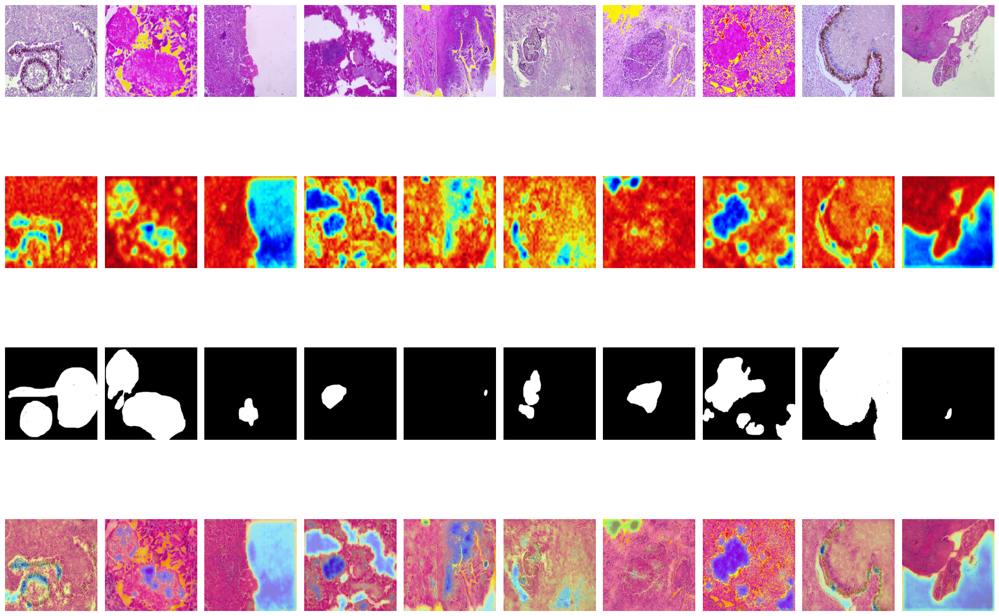

In [ ]:
# Visualize a few samples from the train dataset
fig, axes = plt.subplots(4, 10, figsize=(20, 15))  # Now we have 3 rows: original, Grad-CAM, mask

for i, (image, mask, gradcam, input_images) in enumerate(train_dataset):
    # Move the image, Grad-CAM, and mask to CPU and detach
    image = image.numpy().transpose(1, 2, 0)  # Convert to HWC format for plotting
    image = (image * 0.229 + 0.485) * 255  # Denormalize and convert back to pixel range
    image = image.astype(np.uint8)  # Convert to uint8 for display

    gradcam = gradcam.numpy().transpose(1, 2, 0)  # Convert to HWC for Grad-CAM
    gradcam = (gradcam - gradcam.min()) / (gradcam.max() - gradcam.min())  # Normalize for display
    gradcam = (gradcam * 255).astype(np.uint8)  # Convert to uint8

    mask = mask.numpy()  # Convert mask to numpy for display
    mask = (mask * 255).astype(np.uint8)  # Convert mask to uint8 for display

    # Process concatenated image
    #Overlay Grad-CAM on the original image
    gradcam_overlay = cv2.addWeighted(image, 0.6, gradcam, 0.4, 0)  # Overlay with transparency



    # Plot the original image
    axes[0, i].imshow(image)
    axes[0, i].axis("off")

    # Plot the overlay Grad-CAM image
    axes[1, i].imshow(gradcam, cmap='jet')
    axes[1, i].axis("off")

    # Plot the mask (already a numpy array)
    axes[2, i].imshow(mask, cmap='gray')
    axes[2, i].axis("off")

    # Plot the overlay Grad-CAM image
    axes[3, i].imshow(gradcam_overlay)
    axes[3, i].axis("off")

    if i == 9:  # Stop after 10 samples
        break

plt.tight_layout()
plt.show()

In [ ]:
# Import UNet++ if available in your library
!pip install segmentation_models_pytorch


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 10.9 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=3bd426c132c7fcda2b6d856cb700420f6ff2e3f6dbfc57196cb27f7025015ac9
  Stored in directory: /root/.cache/pip/wheels/8b/6f/9b/231a832f811ab6ebb1b32455b177ffc6b8b1cd8de19de70c09
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=b518e55c960ea4e6b7606279b3e63582049393faca343508282ebafab3e9a247
  Stored in directory: /root/.cache/pip/wheels/5f/5b/96/fd94bc35962d7c6b699e8814db545155ac91d2b95785e1b035
Successfully built efficientnet-pytorch pretrainedmodels


In [ ]:
from segmentation_models_pytorch import UnetPlusPlus

# Initialize the UNet++ model
model = UnetPlusPlus(encoder_name="efficientnet-b3", encoder_weights="imagenet", decoder_attention_type= "scse", activation= "softmax" ,in_channels=6, classes=4)
model = model.to(device)


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b3-5fb5a3c3.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b3-5fb5a3c3.pth
100%|██████████| 47.1M/47.1M [00:01<00:00, 43.7MB/s]


In [ ]:
!pip install torchinfo
from torchinfo import summary

# Set batch size and input size
summary(model, input_size=(1,6 , 224, 224), mode="eval")


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1844: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return inner()


Layer (type:depth-idx)                                       Output Shape              Param #
UnetPlusPlus                                                 [1, 4, 224, 224]          --
├─EfficientNetEncoder: 1-1                                   [1, 6, 224, 224]          592,896
│    └─Conv2dStaticSamePadding: 2-1                          [1, 40, 112, 112]         2,160
│    │    └─ZeroPad2d: 3-1                                   [1, 6, 225, 225]          --
│    └─BatchNorm2d: 2-2                                      [1, 40, 112, 112]         80
│    └─MemoryEfficientSwish: 2-3                             [1, 40, 112, 112]         --
│    └─ModuleList: 2-4                                       --                        --
│    │    └─MBConvBlock: 3-2                                 [1, 24, 112, 112]         2,298
│    │    └─MBConvBlock: 3-3                                 [1, 24, 112, 112]         1,206
│    │    └─MBConvBlock: 3-4                                 [1, 32, 56, 56]     

In [ ]:
ce = nn.CrossEntropyLoss()
def UNetLoss(preds , targets):
    ce_loss = ce(preds , targets)
    acc = (torch.max(preds, 1)[1] == targets).float().mean()
    return ce_loss, acc

In [ ]:
def train_batch(model, data, optimizer, criterion):
    model.train()
    ims, ce_masks, gradcams, input_images = data
    _masks = model(input_images)

    optimizer.zero_grad()

    loss, acc = criterion(_masks, ce_masks)
    loss.backward()
    optimizer.step()

    return loss.item(), acc.item()

@torch.no_grad()
def validate_batch(model, data, criterion):
    model.eval()
    ims, masks, gradcams, input_images = data
    _masks = model(input_images)
    loss, acc = criterion(_masks, masks)

    return loss.item(), acc.item()

In [ ]:
criterion = UNetLoss
optimizer = optim.Adam(model.parameters(), lr=1e-3)
n_epochs = 55

In [ ]:
from torch_snippets.torch_loader import Report

log = Report(n_epochs)

# Training loop
for ex in range(n_epochs):
    N = len(trn_dl)
    for bx, data in enumerate(trn_dl):
        loss, acc = train_batch(model, data, optimizer, criterion)
        log.record(ex + (bx + 1) / N, trn_loss=loss, trn_acc=acc, end='\r')

    N = len(val_dl)
    for bx, data in enumerate(val_dl):
        loss, acc = validate_batch(model, data, criterion)
        log.record(ex + (bx + 1) / N, val_loss=loss, val_acc=acc, end='\r')

    log.report_avgs(ex + 1)

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1736: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


EPOCH: 1.000  val_acc: 0.892  trn_loss: 0.903  val_loss: 0.852  trn_acc: 0.865  (3966.00s - 214164.25s remaining)
EPOCH: 2.000  val_acc: 0.895  trn_loss: 0.836  val_loss: 0.848  trn_acc: 0.908  (4138.17s - 109661.44s remaining)
EPOCH: 3.000  val_acc: 0.923  trn_loss: 0.826  val_loss: 0.820  trn_acc: 0.918  (4310.34s - 74712.61s remaining)
EPOCH: 4.000  val_acc: 0.939  trn_loss: 0.809  val_loss: 0.804  trn_acc: 0.934  (4487.23s - 57212.23s remaining)
EPOCH: 5.000  val_acc: 0.931  trn_loss: 0.803  val_loss: 0.812  trn_acc: 0.940  (4662.04s - 46620.43s remaining)
EPOCH: 6.000  val_acc: 0.940  trn_loss: 0.803  val_loss: 0.803  trn_acc: 0.941  (4835.09s - 39486.53s remaining)
EPOCH: 7.000  val_acc: 0.948  trn_loss: 0.790  val_loss: 0.795  trn_acc: 0.953  (5007.28s - 34335.65s remaining)
EPOCH: 8.000  val_acc: 0.868  trn_loss: 0.792  val_loss: 0.875  trn_acc: 0.951  (5179.81s - 30431.41s remaining)
EPOCH: 9.000  val_acc: 0.929  trn_loss: 0.805  val_loss: 0.814  trn_acc: 0.938  (5351.72s - 27

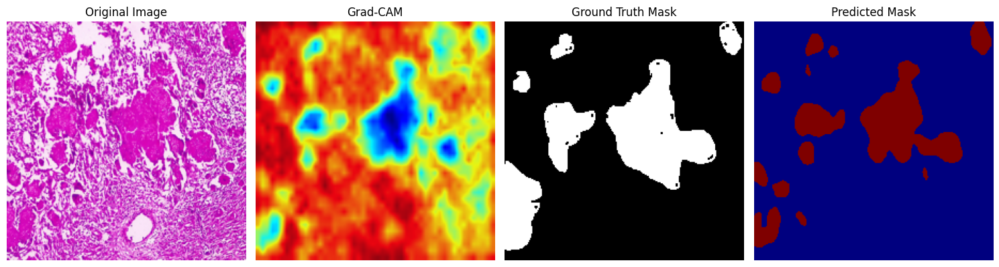

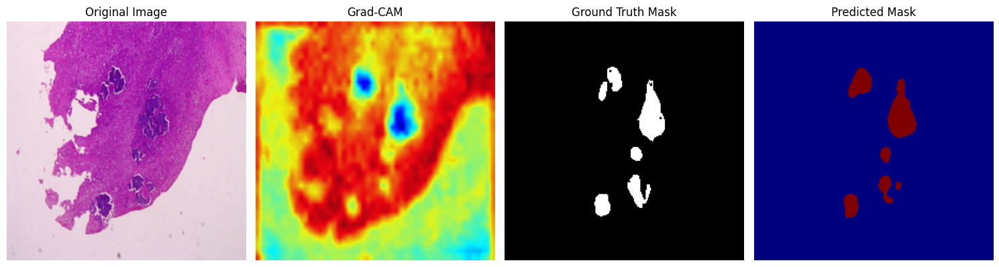

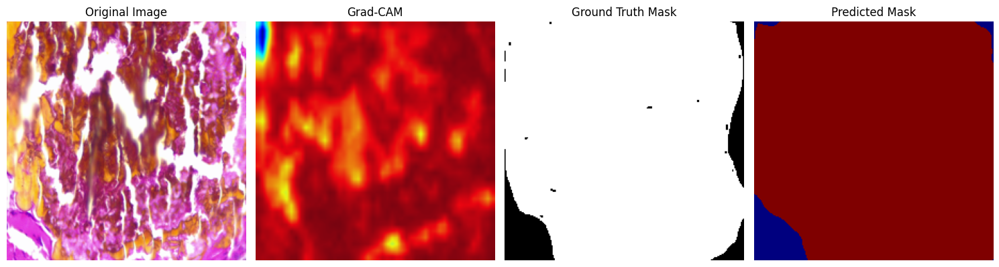

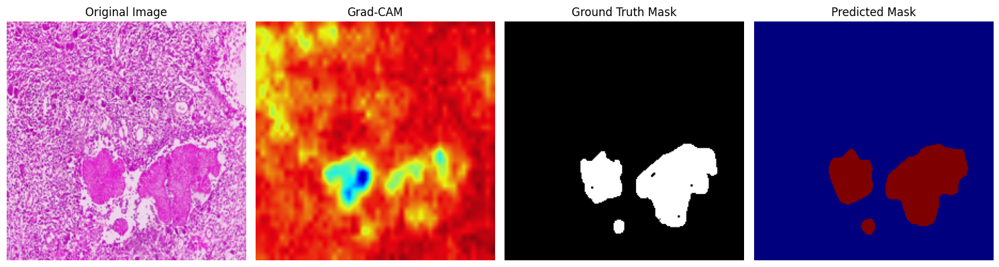

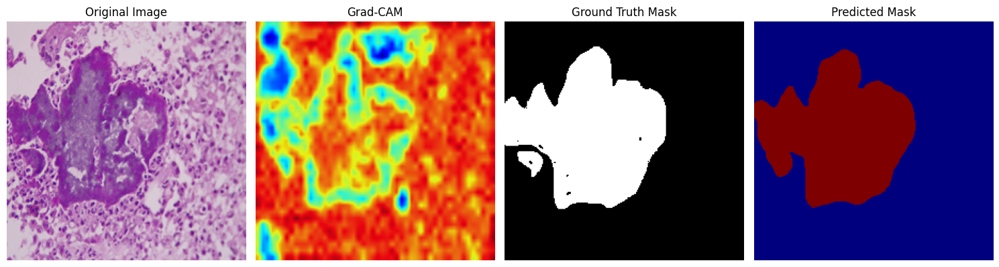

...

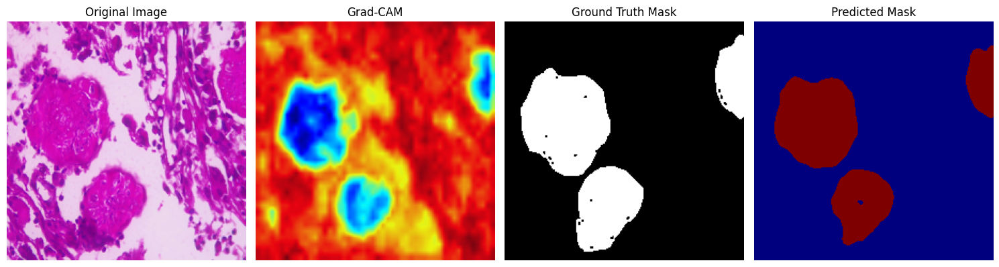

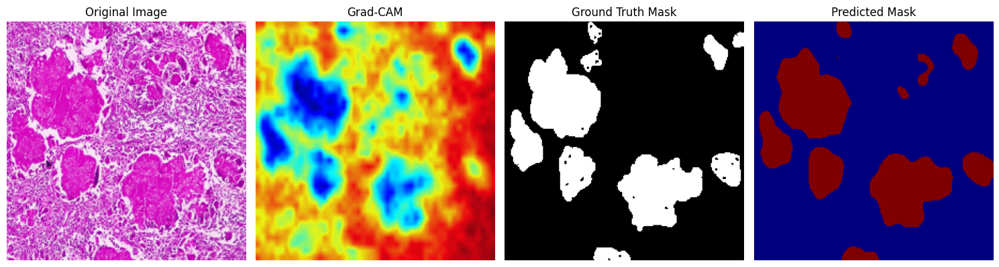

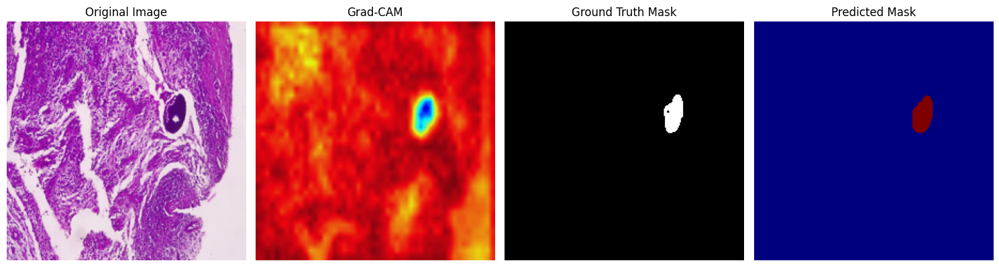

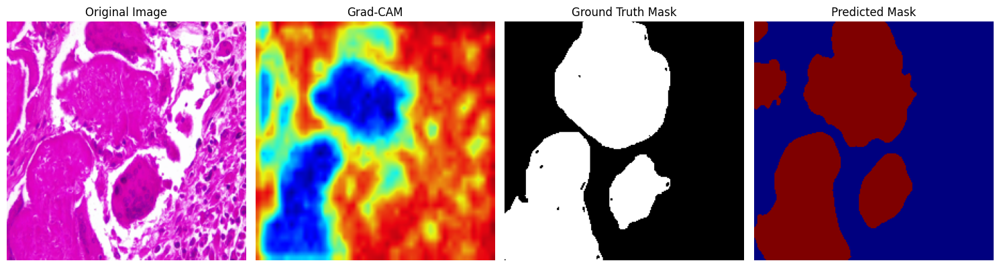

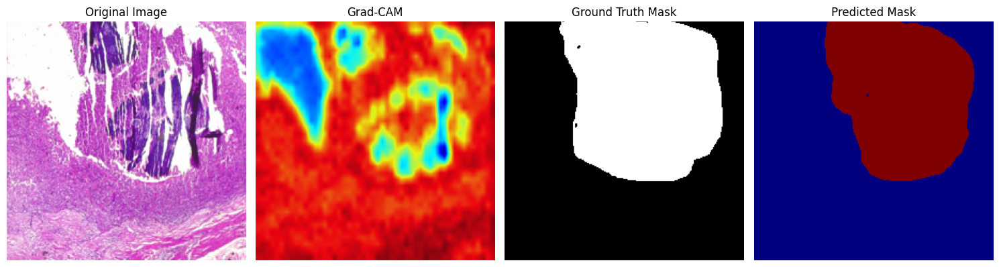

In [ ]:
# Visual Inspection
def visualize_predictions1(data_loader, model, num_images=40):
    model.eval()
    for i, (image, mask, gradcam, input_images) in enumerate(data_loader):
        if i >= num_images:
            break

        image = image.to(device)
        mask = mask.to(device)

        with torch.no_grad():
            # Get the prediction
            pred = model(input_images)
            pred = torch.argmax(pred, dim=1).cpu().numpy()

        # Convert images and masks back to numpy for visualization
        image = image[0].cpu().numpy().transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)

        # Correct the denormalization process
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean  # Denormalize using the original mean and std
        image = np.clip(image * 255, 0, 255).astype(np.uint8)  # Rescale to [0, 255]

        gradcam = gradcam[0].cpu().numpy().transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
        gradcam = (gradcam - gradcam.min()) / (gradcam.max() - gradcam.min())  # Normalize for display
        gradcam = (gradcam * 255).astype(np.uint8)  # Convert to uint8

        mask = mask[0].cpu().numpy()  # Convert mask to numpy for display
        mask = (mask * 255).astype(np.uint8)  # Convert mask to uint8

        # Display images, Grad-CAM, masks, and predictions
        fig, axes = plt.subplots(1, 4, figsize=(15, 5))  # Now 4 columns: original, Grad-CAM, mask, pred
        axes[0].imshow(image)
        axes[0].set_title('Original Image')
        axes[0].axis('off')

        axes[1].imshow(gradcam, cmap='jet')
        axes[1].set_title('Grad-CAM++')
        axes[1].axis('off')

        axes[2].imshow(mask, cmap='gray')
        axes[2].set_title('Ground Truth Mask')
        axes[2].axis('off')

        axes[3].imshow(pred[0], cmap='jet')
        axes[3].set_title('Predicted Mask')
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()

visualize_predictions1(val_dl, model)


In [ ]:
import torch
import torch.nn.functional as F
from sklearn.metrics import jaccard_score
from skimage import morphology
from scipy.ndimage import gaussian_filter
import numpy as np

# Evaluation Metrics Functions
def dice_coefficient(preds, targets, smooth=1):
    # Flatten the tensors to calculate Dice
    preds = preds.contiguous().view(-1)
    targets = targets.contiguous().view(-1)
    intersection = (preds * targets).sum()
    dice = (2. * intersection + smooth) / (preds.sum() + targets.sum() + smooth)
    return dice.item()

def iou(preds, targets, smooth=1):
    # Flatten the tensors to calculate IoU
    preds = preds.contiguous().view(-1)
    targets = targets.contiguous().view(-1)
    intersection = (preds * targets).sum()
    union = preds.sum() + targets.sum() - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def pixel_accuracy(preds, targets):
    correct = (preds == targets).float()
    accuracy = correct.sum() / correct.numel()
    return accuracy.item()

# Model Evaluation Function
@torch.no_grad()
def evaluate_model(model, data_loader, device):
    model.eval()
    dice_scores, iou_scores, accuracy_scores = [], [], []

    for images, masks, gradcams, input_images in data_loader:  # Unpack 4 values
        images = images.to(device)
        masks = masks.to(device)

        preds = model(input_images)  # Use input_images for prediction
        preds = torch.argmax(preds, dim=1)  # Get the predicted class (assuming output is one-hot)

        # Calculate metrics
        dice = dice_coefficient(preds, masks)
        iou_score = iou(preds, masks)
        accuracy = pixel_accuracy(preds, masks)

        dice_scores.append(dice)
        iou_scores.append(iou_score)
        accuracy_scores.append(accuracy)

    print(f"Average Dice Coefficient: {np.mean(dice_scores):.4f}")
    print(f"Average IoU: {np.mean(iou_scores):.4f}")
    print(f"Average Pixel Accuracy: {np.mean(accuracy_scores):.4f}")

    return np.mean(dice_scores), np.mean(iou_scores), np.mean(accuracy_scores)

# Run Model Evaluation
dice_score, iou_score, accuracy_score = evaluate_model(model, val_dl, device)


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1736: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Average Dice Coefficient: 0.9145
Average IoU: 0.8435
Average Pixel Accuracy: 0.9585
